E-Commerce Sentiment Analysis

In [45]:
# Importing the Libraries

import os
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
import numpy as np
import re
# import plotly.express as px
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.layers import Dense, Dropout
from keras.layers import LSTM
from keras.models import Sequential
from keras.layers import Bidirectional
from keras.layers import Embedding
from keras.layers import GlobalAvgPool1D
# from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import svm
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import roc_auc_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import nltk
nltk.download('punkt')
import nltk
nltk.download('wordnet')



[nltk_data] Downloading package punkt to C:\Users\sd
[nltk_data]     pro\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\sd
[nltk_data]     pro\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [46]:
data = pd.read_csv("product_descriptions_1.csv" , index_col=0)
data.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


**As you can see from the head of the dataset, we have some unnecessary features such as Clothing ID, Title. First of all, I will drop this features.**

In [47]:
data = data.drop(['Title', 'Clothing ID', 'Positive Feedback Count'], axis=1)
data.head()

,Age,Review Text,Rating,Recommended IND,Division Name,Department Name,Class Name
0,33,Absolutely wonderful - silky and sexy and comf...,4,1,Initmates,Intimate,Intimates
1,34,Love this dress! it's sooo pretty. i happene...,5,1,General,Dresses,Dresses
2,60,I had such high hopes for this dress and reall...,3,0,General,Dresses,Dresses
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,General Petite,Bottoms,Pants
4,47,This shirt is very flattering to all due to th...,5,1,General,Tops,Blouses


In [48]:
# Checking for the missing values
count_NaN = data.isna().sum()
count_NaN

Age                  0
Review Text        845
Rating               0
Recommended IND      0
Division Name       14
Department Name     14
Class Name          14
dtype: int64

In [49]:
# Dropping the missing values in the rows
data = data.dropna(subset=['Review Text', 'Division Name', 'Department Name', 'Class Name'], axis=0)
data = data.reset_index(drop=True)

# Checking for the missing values after the drops
count_NaN_updated = data.isna().sum()
count_NaN_updated

Age                0
Review Text        0
Rating             0
Recommended IND    0
Division Name      0
Department Name    0
Class Name         0
dtype: int64

In [50]:
import plotly.express as px

In [51]:
fig = px.histogram(data['Rating'],
                   labels={'value': 'Rating',
                           'count': 'Frequency',
                           'color': 'Rating'}, color=data['Rating'])
fig.update_layout(bargap=0.2)
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Distribution of the Ratings',
                  title_x=0.5, title_font=dict(size=20))
fig.show()

In [52]:
def sentiment_creator(row):
    if row['Rating'] == 3:
        val = 'Neutral'
    elif row['Rating'] < 3:
        val = 'Negative'
    else:
        val = 'Possitive'
    return val

In [53]:
data['Sentiment'] = data.apply(sentiment_creator, axis=1)


In [54]:
data.head()

,Age,Review Text,Rating,Recommended IND,Division Name,Department Name,Class Name,Sentiment
0,33,Absolutely wonderful - silky and sexy and comf...,4,1,Initmates,Intimate,Intimates,Possitive
1,34,Love this dress! it's sooo pretty. i happene...,5,1,General,Dresses,Dresses,Possitive
2,60,I had such high hopes for this dress and reall...,3,0,General,Dresses,Dresses,Neutral
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,General Petite,Bottoms,Pants,Possitive
4,47,This shirt is very flattering to all due to th...,5,1,General,Tops,Blouses,Possitive


# Distribution of the Age of the Customers

In [55]:
fig = px.histogram(data['Age'], marginal='box',
                   labels={'value': 'Age'})

fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Distribution of the Age of the Customers',
                  title_x=0.5, title_font=dict(size=20))
fig.show()

# Distribution of the Recommendations

In [56]:
labels = ['Recommended', 'Not Recommended']
values = [data[data['Recommended IND'] == 1]['Recommended IND'].value_counts()[1],
          data[data['Recommended IND'] == 0]['Recommended IND'].value_counts()[0]]
colors = ['green', 'red']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, opacity=0.8)])
fig.update_traces(textinfo='percent+label', marker=dict(line=dict(color='#000000', width=2), colors=colors))
fig.update_layout(title_text='Distribution of the Recommendations', title_x=0.5, title_font=dict(size=20))
fig.show()

# Distribution of the Age and Recommendation

In [57]:
fig = px.histogram(data['Age'], color=data['Recommended IND'],
                   labels={'value': 'Age',
                           'color': 'Recommended'}, marginal='box')
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Distribution of the Age and Recommendation',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='overlay')
fig.show()

# Relationship between Ratings and Recommendation

In [58]:
fig = px.histogram(data['Rating'], color=data['Recommended IND'],
                   labels={'value': 'Rating',
                           'color': 'Recommended?'})
fig.update_layout(bargap=0.2)
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Relationship between Ratings and Recommendation',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='group')
fig.show()

# Relationship between Ratings and Departments

In [59]:
fig = px.histogram(data['Rating'], color=data['Department Name'],
                   labels={'value': 'Rating',
                           'color': 'Department Name'})
fig.update_layout(bargap=0.2)
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Relationship between Ratings and Departments',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='group')
fig.show()

# Department and Recommendation Distribution

In [60]:
fig = px.histogram(data['Department Name'], color=data['Recommended IND'],
                   labels={'value': 'Department Name',
                           'color': 'Recommended?'})
fig.update_layout(bargap=0.2)
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Department Name and Recommendation Distribution',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='group')
fig.show()

# Division and Recommendation Distribution


In [61]:
fig = px.histogram(data['Division Name'], color=data['Recommended IND'],
                   labels={'value': 'Division Name',
                           'color': 'Recommended?'})
fig.update_layout(bargap=0.2)
fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Division Name and Recommendation Distribution',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='group')
fig.show()

# Distribution of the Length of the Texts

In [62]:
data['length_of_text'] = [len(i.split(' ')) for i in data['Review Text']]
fig = px.histogram(data['length_of_text'], marginal='box',
                   labels={"value": "Length of the Text",
                           "color": 'Recommended'},
                   color=data['Recommended IND'])

fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Distribution of the Length of the Texts',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='overlay')
fig.show()

# <center> Data Preprocessing

**In this step I will be dealing with the cleaning text data.**

In [63]:
# Lower Character all the Texts
data['Review Text'] = data['Review Text'].str.lower()
data['Review Text'].head()

0    absolutely wonderful - silky and sexy and comf...
1    love this dress!  it's sooo pretty.  i happene...
2    i had such high hopes for this dress and reall...
3    i love, love, love this jumpsuit. it's fun, fl...
4    this shirt is very flattering to all due to th...
Name: Review Text, dtype: object

In [64]:
# Removing Punctuations and Numbers from the Text
def remove_punctuations_numbers(inputs):
    return re.sub(r'[^a-zA-Z]', ' ', inputs)


data['Review Text'] = data['Review Text'].apply(remove_punctuations_numbers)

# Tokenizing with NLTK

In [98]:
def tokenization(inputs):  # Ref.1
    return word_tokenize(inputs)


data['text_tokenized'] = data['Review Text'].apply(tokenization)
# data['text_tokenized']
for i in data['text_tokenized']:
    print (i)

['absolutely', 'wonderful', 'silky', 'and', 'sexy', 'and', 'comfortable']
['love', 'this', 'dress', 'it', 's', 'sooo', 'pretty', 'i', 'happened', 'to', 'find', 'it', 'in', 'a', 'store', 'and', 'i', 'm', 'glad', 'i', 'did', 'bc', 'i', 'never', 'would', 'have', 'ordered', 'it', 'online', 'bc', 'it', 's', 'petite', 'i', 'bought', 'a', 'petite', 'and', 'am', 'i', 'love', 'the', 'length', 'on', 'me', 'hits', 'just', 'a', 'little', 'below', 'the', 'knee', 'would', 'definitely', 'be', 'a', 'true', 'midi', 'on', 'someone', 'who', 'is', 'truly', 'petite']
['i', 'had', 'such', 'high', 'hopes', 'for', 'this', 'dress', 'and', 'really', 'wanted', 'it', 'to', 'work', 'for', 'me', 'i', 'initially', 'ordered', 'the', 'petite', 'small', 'my', 'usual', 'size', 'but', 'i', 'found', 'this', 'to', 'be', 'outrageously', 'small', 'so', 'small', 'in', 'fact', 'that', 'i', 'could', 'not', 'zip', 'it', 'up', 'i', 'reordered', 'it', 'in', 'petite', 'medium', 'which', 'was', 'just', 'ok', 'overall', 'the', 'top',

# Stopwords Removal

In [66]:
stop_words = set(stopwords.words('english'))
stop_words.remove('not')


def stopwords_remove(inputs):  # Ref.2
    return [k for k in inputs if k not in stop_words]


data['text_stop'] = data['text_tokenized'].apply(stopwords_remove)
data['text_stop'].head()

0    [absolutely, wonderful, silky, sexy, comfortable]
1    [love, dress, sooo, pretty, happened, find, st...
2    [high, hopes, dress, really, wanted, work, ini...
3    [love, love, love, jumpsuit, fun, flirty, fabu...
4    [shirt, flattering, due, adjustable, front, ti...
Name: text_stop, dtype: object

# Lemmatization

In [109]:
from statistics import mode
lemmatizer = WordNetLemmatizer()

def lemmatization(inputs):  # Ref.1
    return [lemmatizer.lemmatize(word=kk, pos='v') for kk in inputs]


data['text_lemmatized'] = data['text_stop'].apply(lemmatization)
# data['text_lemmatized'].head()
result = []
for i in data['text_lemmatized']:
    for j in i:
        result.append(j)

temp = [wrd for sub in result for wrd in sub.split()]
res = mode(temp)
print(res)
print('-------------')

dress
-------------


In [68]:
# Removing Words less than length 2
def remove_less_than_2(inputs):  # Ref.1
    return [j for j in inputs if len(j) > 2]


data['final'] = data['text_lemmatized'].apply(remove_less_than_2)

In [69]:
# Joining Tokens into Sentences
data['final'] = data['final'].str.join(' ')
data['final'].head()

0          absolutely wonderful silky sexy comfortable
1    love dress sooo pretty happen find store glad ...
2    high hop dress really want work initially orde...
3    love love love jumpsuit fun flirty fabulous ev...
4    shirt flatter due adjustable front tie perfect...
Name: final, dtype: object

In [102]:
data.head(10)

,Age,Review Text,Rating,Recommended IND,Division Name,Department Name,Class Name,Sentiment,length_of_text,text_tokenized,text_stop,text_lemmatized,final
0,33,absolutely wonderful silky and sexy and comf...,4,1,Initmates,Intimate,Intimates,Possitive,5,"[absolutely, wonderful, silky, and, sexy, and,...","[absolutely, wonderful, silky, sexy, comfortable]","[absolutely, wonderful, silky, sexy, comfortable]",absolutely wonderful silky sexy comfortable
1,34,love this dress it s sooo pretty i happene...,5,1,General,Dresses,Dresses,Possitive,27,"[love, this, dress, it, s, sooo, pretty, i, ha...","[love, dress, sooo, pretty, happened, find, st...","[love, dress, sooo, pretty, happen, find, stor...",love dress sooo pretty happen find store glad ...
2,60,i had such high hopes for this dress and reall...,3,0,General,Dresses,Dresses,Neutral,47,"[i, had, such, high, hopes, for, this, dress, ...","[high, hopes, dress, really, wanted, work, ini...","[high, hop, dress, really, want, work, initial...",high hop dress really want work initially orde...
3,50,i love love love this jumpsuit it s fun fl...,5,1,General Petite,Bottoms,Pants,Possitive,14,"[i, love, love, love, this, jumpsuit, it, s, f...","[love, love, love, jumpsuit, fun, flirty, fabu...","[love, love, love, jumpsuit, fun, flirty, fabu...",love love love jumpsuit fun flirty fabulous ev...
4,47,this shirt is very flattering to all due to th...,5,1,General,Tops,Blouses,Possitive,16,"[this, shirt, is, very, flattering, to, all, d...","[shirt, flattering, due, adjustable, front, ti...","[shirt, flatter, due, adjustable, front, tie, ...",shirt flatter due adjustable front tie perfect...
5,49,i love tracy reese dresses but this one is no...,2,0,General,Dresses,Dresses,Negative,42,"[i, love, tracy, reese, dresses, but, this, on...","[love, tracy, reese, dresses, one, not, petite...","[love, tracy, reese, dress, one, not, petite, ...",love tracy reese dress one not petite feet tal...
6,39,i aded this in my basket at hte last mintue to...,5,1,General Petite,Tops,Knits,Possitive,46,"[i, aded, this, in, my, basket, at, hte, last,...","[aded, basket, hte, last, mintue, see, would, ...","[aded, basket, hte, last, mintue, see, would, ...",aded basket hte last mintue see would look lik...
7,39,i ordered this in carbon for store pick up an...,4,1,General Petite,Tops,Knits,Possitive,47,"[i, ordered, this, in, carbon, for, store, pic...","[ordered, carbon, store, pick, ton, stuff, alw...","[order, carbon, store, pick, ton, stuff, alway...",order carbon store pick ton stuff always try u...
8,24,i love this dress i usually get an xs but it ...,5,1,General,Dresses,Dresses,Possitive,16,"[i, love, this, dress, i, usually, get, an, xs...","[love, dress, usually, get, xs, runs, little, ...","[love, dress, usually, get, xs, run, little, s...",love dress usually get run little snug bust or...
9,34,i m and lbs i ordered the s petite t...,5,1,General,Dresses,Dresses,Possitive,32,"[i, m, and, lbs, i, ordered, the, s, petite, t...","[lbs, ordered, petite, make, sure, length, lon...","[lbs, order, petite, make, sure, length, long,...",lbs order petite make sure length long typical...


In [133]:
dat = data.loc[data['Rating'] < 3]

dat['Department Name']

result = []

for i in dat['Department Name']:
    result.append(i)

temp = [wrd for sub in result for wrd in sub.split()]
res = mode(temp)
print(res)
        

Tops


# WordCloud of the Recommended Reviews

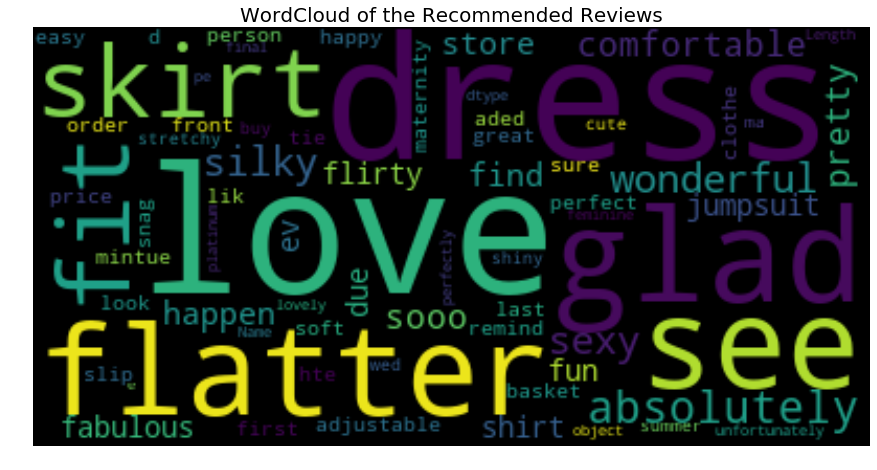

In [71]:
data_recommended = data[data['Recommended IND'] == 1]  # Dataframe that only includes recommended reviews
data_not_recommended = data[data['Recommended IND'] == 0]  # # Dataframe that only includes not recommended reviews

WordCloud_recommended = WordCloud(max_words=500,
                                  random_state=30,
                                  collocations=True).generate(str((data_recommended['final'])))

plt.figure(figsize=(15, 8))
plt.imshow(WordCloud_recommended, interpolation='bilinear')
plt.title('WordCloud of the Recommended Reviews', fontsize=20)
plt.axis("off")
plt.show()

# WordCloud of the Not Recommended Reviews

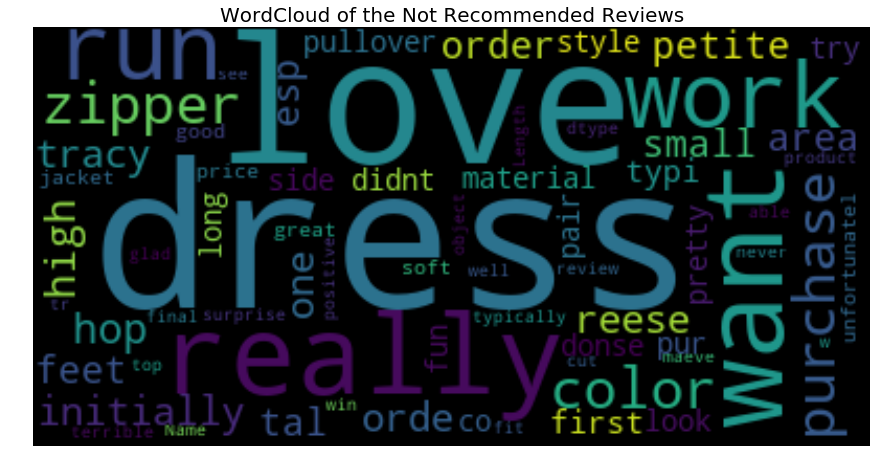

In [72]:
WordCloud_not_recommended = WordCloud(max_words=500,
                                      random_state=30,
                                      collocations=True).generate(str((data_not_recommended['final'])))

plt.figure(figsize=(15, 8))
plt.imshow(WordCloud_not_recommended, interpolation='bilinear')
plt.title('WordCloud of the Not Recommended Reviews', fontsize=20)
plt.axis("off")
plt.show()

# Distribution of the Length of the Texts after Cleaning

In [73]:
data['length_of_text'] = [len(i.split(' ')) for i in data['final']]
fig = px.histogram(data['length_of_text'], marginal='box',
                   labels={"value": "Length of the Text",
                           "color": 'Recommended?'},
                   color=data['Recommended IND'])

fig.update_traces(marker=dict(line=dict(color='#000000', width=2)))
fig.update_layout(title_text='Distribution of the Length of the Texts after Cleaning',
                  title_x=0.5, title_font=dict(size=20))
fig.update_layout(barmode='overlay')
fig.show()

# Train-Test-Validation Split


In [92]:
data.head(10)

,Age,Review Text,Rating,Recommended IND,Division Name,Department Name,Class Name,Sentiment,length_of_text,text_tokenized,text_stop,text_lemmatized,final
0,33,absolutely wonderful silky and sexy and comf...,4,1,Initmates,Intimate,Intimates,Possitive,5,"[absolutely, wonderful, silky, and, sexy, and,...","[absolutely, wonderful, silky, sexy, comfortable]","[absolutely, wonderful, silky, sexy, comfortable]",absolutely wonderful silky sexy comfortable
1,34,love this dress it s sooo pretty i happene...,5,1,General,Dresses,Dresses,Possitive,27,"[love, this, dress, it, s, sooo, pretty, i, ha...","[love, dress, sooo, pretty, happened, find, st...","[love, dress, sooo, pretty, happen, find, stor...",love dress sooo pretty happen find store glad ...
2,60,i had such high hopes for this dress and reall...,3,0,General,Dresses,Dresses,Neutral,47,"[i, had, such, high, hopes, for, this, dress, ...","[high, hopes, dress, really, wanted, work, ini...","[high, hop, dress, really, want, work, initial...",high hop dress really want work initially orde...
3,50,i love love love this jumpsuit it s fun fl...,5,1,General Petite,Bottoms,Pants,Possitive,14,"[i, love, love, love, this, jumpsuit, it, s, f...","[love, love, love, jumpsuit, fun, flirty, fabu...","[love, love, love, jumpsuit, fun, flirty, fabu...",love love love jumpsuit fun flirty fabulous ev...
4,47,this shirt is very flattering to all due to th...,5,1,General,Tops,Blouses,Possitive,16,"[this, shirt, is, very, flattering, to, all, d...","[shirt, flattering, due, adjustable, front, ti...","[shirt, flatter, due, adjustable, front, tie, ...",shirt flatter due adjustable front tie perfect...
5,49,i love tracy reese dresses but this one is no...,2,0,General,Dresses,Dresses,Negative,42,"[i, love, tracy, reese, dresses, but, this, on...","[love, tracy, reese, dresses, one, not, petite...","[love, tracy, reese, dress, one, not, petite, ...",love tracy reese dress one not petite feet tal...
6,39,i aded this in my basket at hte last mintue to...,5,1,General Petite,Tops,Knits,Possitive,46,"[i, aded, this, in, my, basket, at, hte, last,...","[aded, basket, hte, last, mintue, see, would, ...","[aded, basket, hte, last, mintue, see, would, ...",aded basket hte last mintue see would look lik...
7,39,i ordered this in carbon for store pick up an...,4,1,General Petite,Tops,Knits,Possitive,47,"[i, ordered, this, in, carbon, for, store, pic...","[ordered, carbon, store, pick, ton, stuff, alw...","[order, carbon, store, pick, ton, stuff, alway...",order carbon store pick ton stuff always try u...
8,24,i love this dress i usually get an xs but it ...,5,1,General,Dresses,Dresses,Possitive,16,"[i, love, this, dress, i, usually, get, an, xs...","[love, dress, usually, get, xs, runs, little, ...","[love, dress, usually, get, xs, run, little, s...",love dress usually get run little snug bust or...
9,34,i m and lbs i ordered the s petite t...,5,1,General,Dresses,Dresses,Possitive,32,"[i, m, and, lbs, i, ordered, the, s, petite, t...","[lbs, ordered, petite, make, sure, length, lon...","[lbs, order, petite, make, sure, length, long,...",lbs order petite make sure length long typical...


In [75]:
## split the data as for the target and features.

X = data['final']
y = data['Sentiment']

In [89]:
X

0              absolutely wonderful silky sexy comfortable
1        love dress sooo pretty happen find store glad ...
2        high hop dress really want work initially orde...
3        love love love jumpsuit fun flirty fabulous ev...
4        shirt flatter due adjustable front tie perfect...
                               ...                        
22623    happy snag dress great price easy slip flatter...
22624    remind maternity clothe soft stretchy shiny ma...
22625    fit well top see never would work glad able tr...
22626    buy dress wed summer cute unfortunately fit pe...
22627    dress lovely platinum feminine fit perfectly e...
Name: final, Length: 22628, dtype: object

In [91]:
y.head(50)

0     Possitive
1     Possitive
2       Neutral
3     Possitive
4     Possitive
5      Negative
6     Possitive
7     Possitive
8     Possitive
9     Possitive
10      Neutral
11    Possitive
12    Possitive
13    Possitive
14      Neutral
15    Possitive
16      Neutral
17    Possitive
18    Possitive
19    Possitive
20    Possitive
21    Possitive
22     Negative
23      Neutral
24    Possitive
25      Neutral
26     Negative
27    Possitive
28    Possitive
29    Possitive
30    Possitive
31    Possitive
32    Possitive
33     Negative
34    Possitive
35    Possitive
36    Possitive
37    Possitive
38    Possitive
39    Possitive
40    Possitive
41    Possitive
42    Possitive
43    Possitive
44    Possitive
45    Possitive
46    Possitive
47    Possitive
48    Possitive
49    Possitive
Name: Sentiment, dtype: object

In [76]:
## split dataset 

X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.2, random_state = 60,shuffle=True)

In [77]:
vectorizer = TfidfVectorizer()
tfidf_text = vectorizer.fit_transform(X_train)

In [78]:
# Naive Bayes

nb = Pipeline([
    ('tfidf', TfidfVectorizer()),
               
    ('clf', MultinomialNB()),
    ])

nb.fit(X_train,Y_train)

test_predict = nb.predict(X_test)

accuracy = round(nb.score(X_train,Y_train)*100)
test_accuracy =round(accuracy_score(test_predict, Y_test)*100)


print("Naive Bayes Train Accuracy Score : {}% ".format(accuracy ))
# print("Naive Bayes Test Accuracy Score  : {}% ".format(test_accuracy ))


Naive Bayes Train Accuracy Score : 77% 


In [95]:
knn = Pipeline([('tfidf', TfidfVectorizer()),
                ('knn', KNeighborsClassifier(n_neighbors=5, metric='euclidean')),
               ])

knn.fit(X_train, Y_train)

test_predict = knn.predict(X_test)

train_accuracy = round(knn.score(X_train,Y_train)*100)
test_accuracy =round(accuracy_score(test_predict, Y_test)*100)

print("K-Nearest Neighbour Train Accuracy Score : {}% ".format(train_accuracy ))
print("K-Nearest Neighbour Test Accuracy Score  : {}% ".format(test_accuracy ))

K-Nearest Neighbour Train Accuracy Score : 84% 
K-Nearest Neighbour Test Accuracy Score  : 78% 


In [97]:
dt = Pipeline([('tfidf', TfidfVectorizer()),
                ('dt', DecisionTreeClassifier()),
               ])

dt.fit(X_train, Y_train)

test_predict = dt.predict(X_test)

accuracy = round(dt.score(X_train,Y_train)*100)
test_accuracy =round(accuracy_score(test_predict, Y_test)*100)

print("Decision Tree Accuracy Score : {}% ".format(accuracy ))
print("Decision Tree Test Accuracy Score  : {}% ".format(test_accuracy ))

Decision Tree Accuracy Score : 100% 
Decision Tree Test Accuracy Score  : 73% 


In [81]:
sgd = Pipeline([('tfidf', TfidfVectorizer()),
                ('clf', SGDClassifier()),
               ])

sgd.fit(X_train, Y_train)

test_predict = sgd.predict(X_test)

train_accuracy = round(sgd.score(X_train,Y_train)*100)
test_accuracy =round(accuracy_score(test_predict, Y_test)*100)

print("SVM Accuracy Score : {}% ".format(train_accuracy ))
# print("SVM Test Accuracy Score  : {}% ".format(test_accuracy ))

SVM Accuracy Score : 85% 


<h1><center> Emoji Processing</center></h1>

In [82]:
!pip install emot

In [83]:
import re
import pickle
from emot.emo_unicode import UNICODE_EMOJI

In [84]:
import re
def remove_emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F" # emoticons
                           u"\U0001F300-\U0001F5FF" # symbols & pictographs
                           u"\U0001F680-\U0001F6FF" # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF" # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)

In [85]:
remove_emoji("Hilarious 😂! The feeling of making a sale 😎, The feeling of actually fulfilling orders 😒")

'Hilarious ! The feeling of making a sale , The feeling of actually fulfilling orders '

In [87]:
with open('Emoji_Dict.p', 'rb') as fp:
    Emoji_Dict = pickle.load(fp)
Emoji_Dict = {v: k for k, v in Emoji_Dict.items()}

def convert_emojis_to_word(text):
    for emot in Emoji_Dict:
        text = re.sub(r'('+emot+')', "_".join(Emoji_Dict[emot].replace(",","").replace(":","").split()), text)
    return text

text = "I won 🥇 in 🏏"
convert_emojis_to_word(text)

'I won 1st_place_medal in cricket'

In [88]:
convert_emojis_to_word("I like to eat 🍕")

'I like to eat pizza'

<h1><center>End</center></h1>